# Fitting the JWST NIRSpec Transit of WASP-107 b With an Oblate Transit Model

In [1]:
NUM_CORES = 2
import argparse
import pandas as pd

import jax.numpy as jnp
import jax
import numpy as np
import matplotlib.pyplot as plt
from jax import grad, jit, vmap
import numpyro
from numpyro import distributions as dist
from numpyro import infer

from numpyro_ext import distributions as distx
import numpyro_ext.distributions, numpyro_ext.optim

import os
os.environ["XLA_FLAGS"] = f"--xla_force_host_platform_device_count={NUM_CORES}"

jax.config.update("jax_enable_x64", True)
numpyro.set_host_device_count(NUM_CORES)

from jaxoplanet import light_curves, orbits
from jaxoplanet.light_curves import limb_dark_light_curve
import arviz as az

from tinygp import GaussianProcess, kernels


from eclipsoid.legacy.light_curve import oblate_lightcurve_dict
import paths

oblate_lightcurve = jit(oblate_lightcurve_dict)

In [2]:
df = pd.read_csv(paths.data/'Sing_2024_Fig1_WASP107b_white_light_curve_data.csv')
t = jnp.array(df['bjd_tdb(days)'] - 2460118.948861)
nsr_1_f = jnp.array(df['NRS1_wlc_flux'])
nsr_1_f_err = jnp.array(df['NRS1_wlc_flux_err'])
nrs_2_f = jnp.array(df['NRS2_wlc_flux'])
nrs_2_f_err = jnp.array(df['NRS2_wlc_flux_err'])

In [3]:
inf_data = az.from_netcdf(paths.data/"wasp_107_circular_mcmc_jointfit_posterior.h5")
az.summary(inf_data, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration',
                                'nrs1_log_jitter', 'nrs2_log_jitter',
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
t0,0.000,0.000,0.000,0.000,0.000,0.000,9623.0,5675.0,1.0
r_circ,0.144,0.000,0.144,0.144,0.000,0.000,7571.0,5929.0,1.0
bo,0.126,0.011,0.105,0.148,0.000,0.000,6703.0,4383.0,1.0
u_nrs1[0],0.111,0.007,0.098,0.124,0.000,0.000,9140.0,6343.0,1.0
u_nrs1[1],0.181,0.014,0.154,0.207,0.000,0.000,8336.0,6147.0,1.0
u_nrs2[0],0.073,0.008,0.057,0.089,0.000,0.000,8735.0,5813.0,1.0
u_nrs2[1],0.155,0.016,0.124,0.185,0.000,0.000,8431.0,5887.0,1.0
duration,0.115,0.000,0.115,0.115,0.000,0.000,9529.0,5813.0,1.0
nrs1_log_jitter,-9.749,0.113,-9.976,-9.558,0.001,0.001,9932.0,5283.0,1.0
nrs2_log_jitter,-10.288,0.410,-11.053,-9.619,0.006,0.004,6668.0,3509.0,1.0


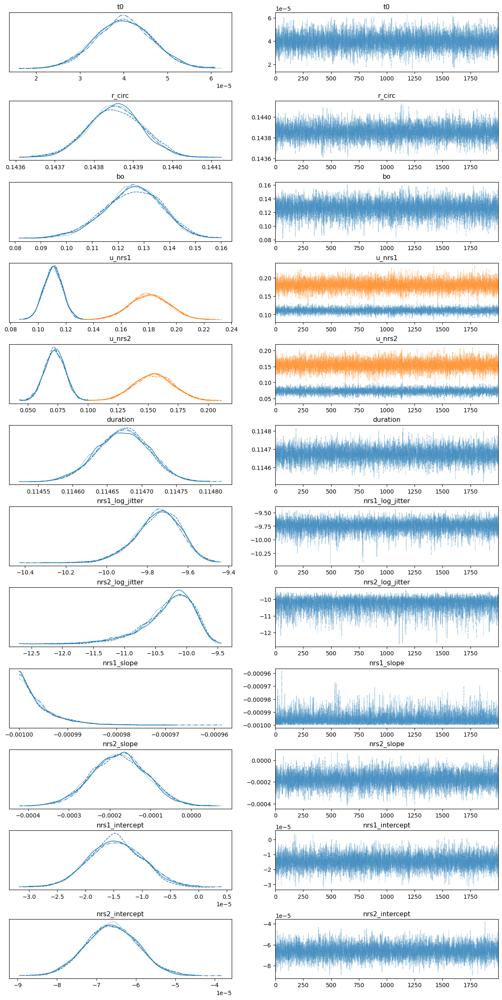

In [4]:
az.plot_trace(
    inf_data,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration',
                                'nrs1_log_jitter', 'nrs2_log_jitter',
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'],
    backend_kwargs={"constrained_layout": True},
);

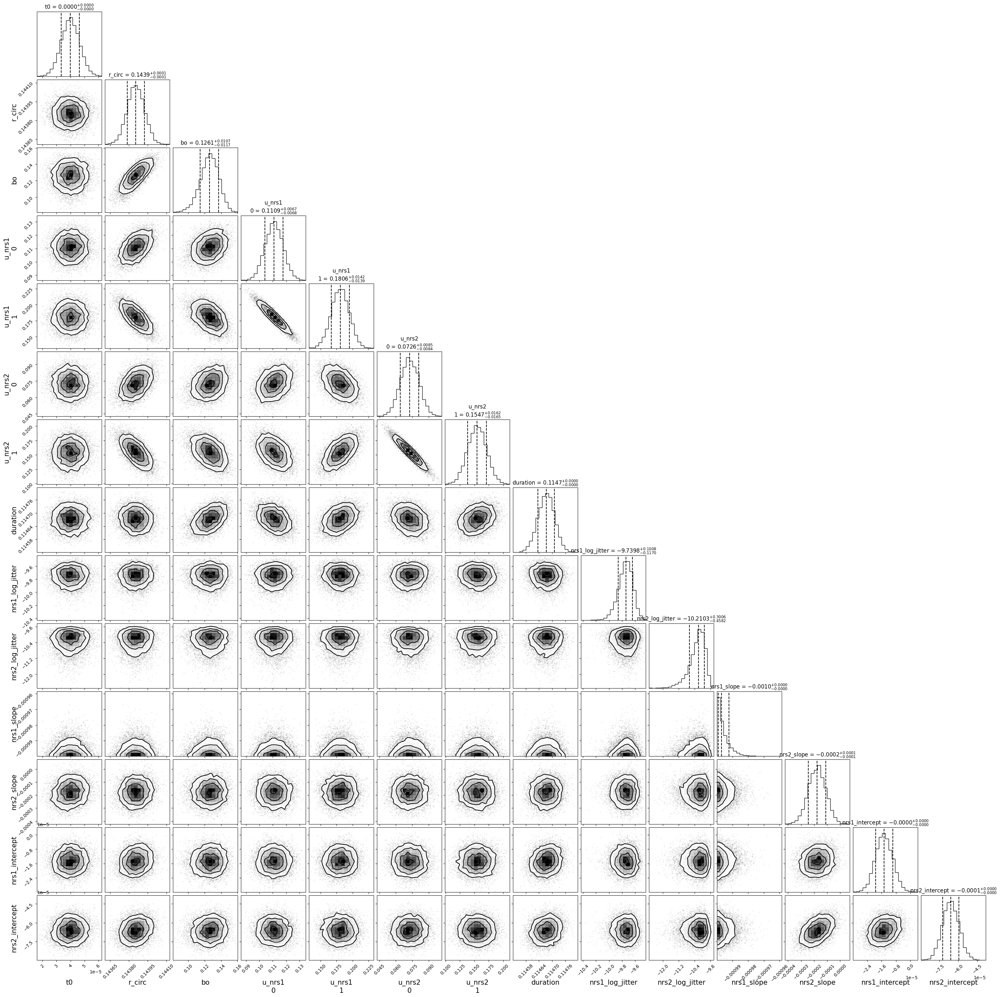

In [5]:
import corner
corner.corner(
    inf_data,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration',
                                'nrs1_log_jitter', 'nrs2_log_jitter',
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'],
    show_titles=True,
    quantiles=[0.16, 0.5, 0.84],
    title_kwargs={"fontsize": 12},
    label_kwargs={"fontsize": 15},
    title_fmt=".4f",
);

In [47]:
inf_data_obl = az.from_netcdf(paths.data/"wasp_107_oblate_mcmc_jointfit_posterior.h5")
az.summary(inf_data_obl, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta','hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
t0,0.000,0.000,0.000,0.000,0.000,0.000,6046.0,4807.0,1.00
r_circ,0.144,0.000,0.144,0.144,0.000,0.000,1472.0,1437.0,1.01
bo,0.131,0.053,0.035,0.211,0.002,0.001,766.0,734.0,1.02
u_nrs1[0],0.110,0.007,0.097,0.123,0.000,0.000,3152.0,2731.0,1.00
u_nrs1[1],0.181,0.014,0.154,0.208,0.000,0.000,3834.0,3664.0,1.00
u_nrs2[0],0.072,0.009,0.056,0.089,0.000,0.000,3917.0,3463.0,1.00
u_nrs2[1],0.155,0.017,0.124,0.186,0.000,0.000,4576.0,4347.0,1.00
duration,0.115,0.000,0.114,0.115,0.000,0.000,888.0,892.0,1.01
f,0.087,0.049,0.027,0.194,0.001,0.001,1762.0,1445.0,1.01
theta,-0.923,0.213,-1.324,-0.660,0.007,0.005,1111.0,1395.0,1.01


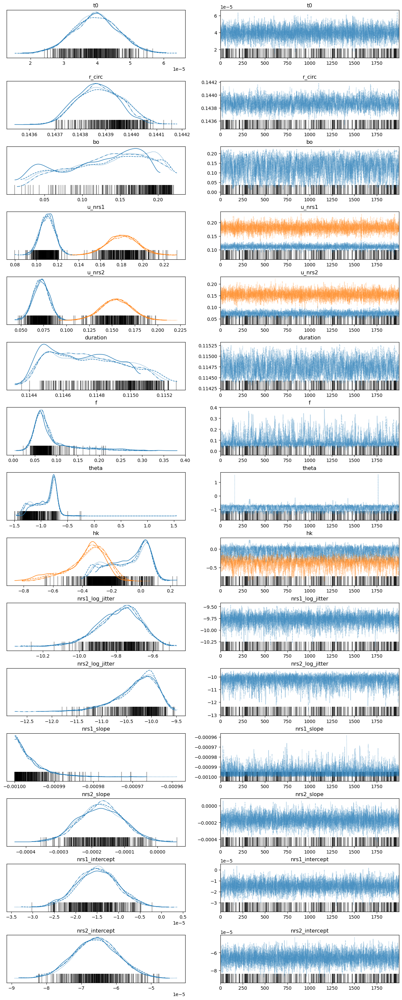

In [49]:
az.plot_trace(
    inf_data_obl, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta','hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'],
    backend_kwargs={"constrained_layout": True},
);

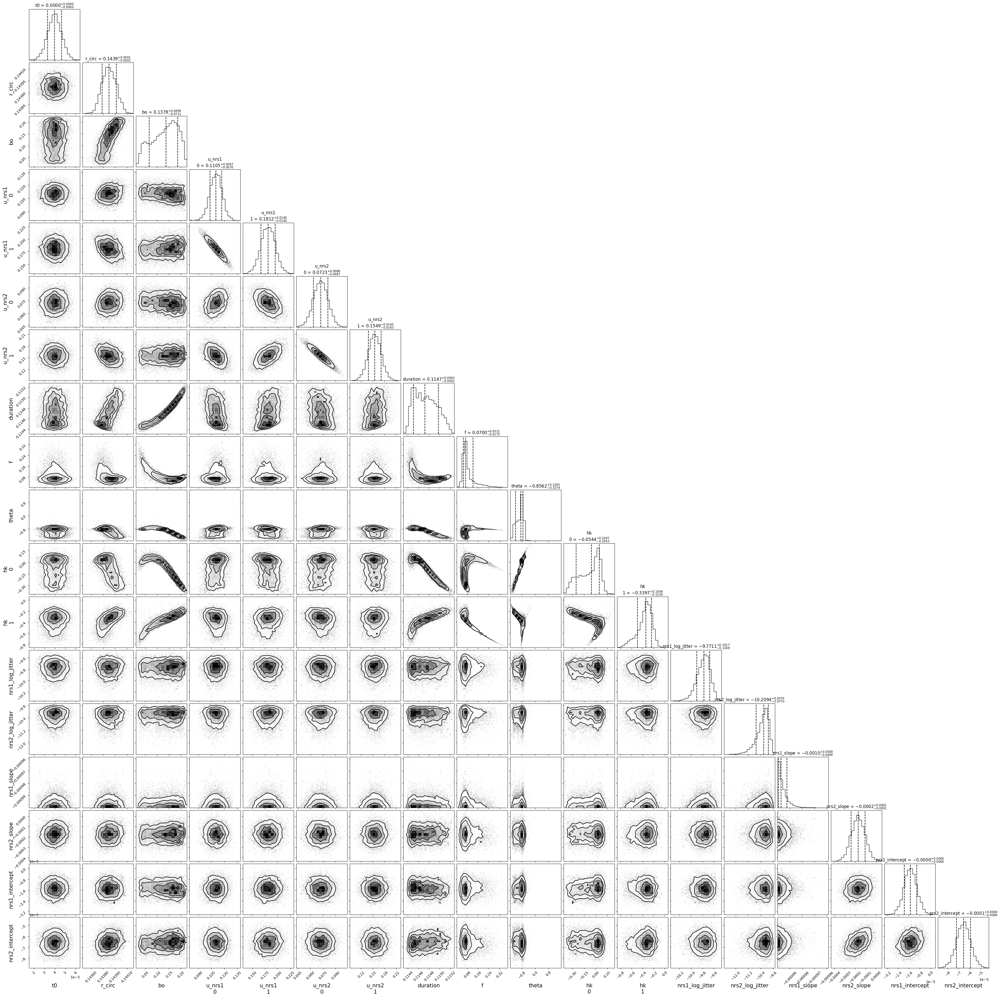

In [51]:
import corner
corner.corner(
    inf_data_obl,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta','hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept'],
    show_titles=True,
    quantiles=[0.16, 0.5, 0.84],
    title_kwargs={"fontsize": 12},
    label_kwargs={"fontsize": 15},
    title_fmt=".4f",
);

Text(0.5, 0, 'Time (days)')

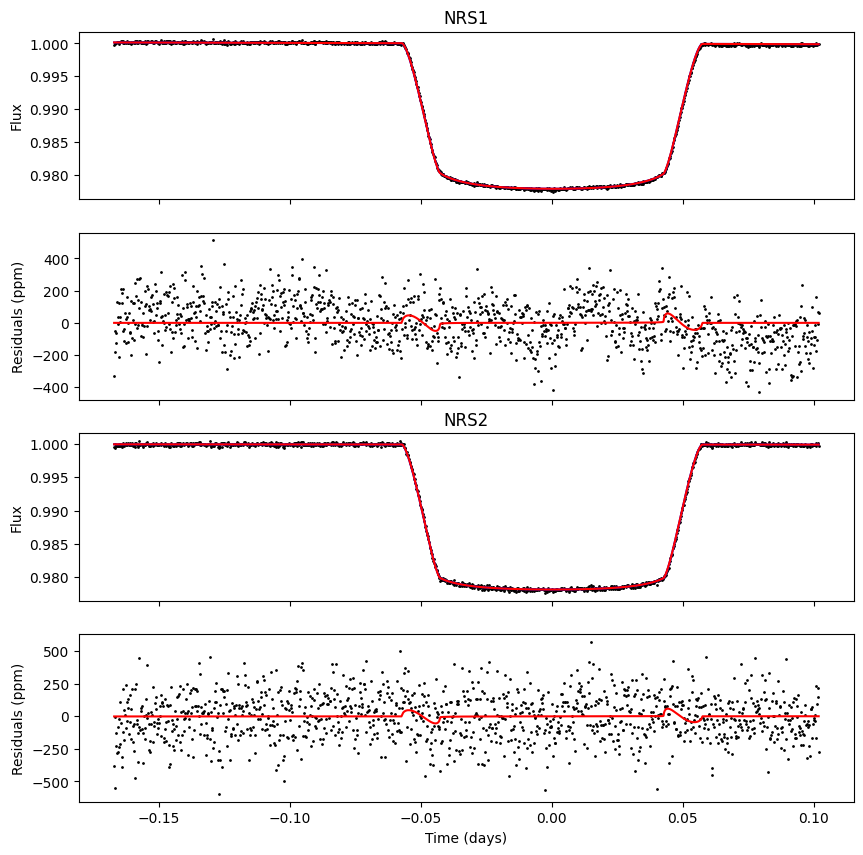

In [56]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(4,1,figsize=(10,10), sharex=True)

inf_data = az.from_netcdf(paths.data/"wasp_107_circular_mcmc_jointfit_posterior.h5")
az.summary(inf_data, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                'nrs1_slope', 'nrs2_slope', 'nrs1_intercept', 'nrs2_intercept',])

nrs1_mean_lc = inf_data.posterior["nrs1_light_curve"].mean(axis=(0,1)).to_numpy()
nrs2_mean_lc = inf_data.posterior["nrs2_light_curve"].mean(axis=(0,1)).to_numpy()

nrs1_mean_lc_obl = inf_data_obl.posterior["nrs1_light_curve"].mean(axis=(0,1)).to_numpy()

nrs2_mean_lc_obl = inf_data_obl.posterior["nrs2_light_curve"].mean(axis=(0,1)).to_numpy()

ax1.scatter(t,nsr_1_f,c='k',s=1)
ax2.scatter(t,nrs_2_f,c='k',s=1)
ax1.plot(t,nrs1_mean_lc,c='b', label="mean circular transit model")
ax1.plot(t,nrs1_mean_lc_obl,c='r', label="mean oblate transit model")
ax1.set_title("NRS1")
ax2.plot(t,nrs2_mean_lc,c='b', label="mean circular transit model")
ax2.plot(t,nrs2_mean_lc_obl,c='r', label="mean oblate transit model")
ax2.set_title("NRS2")
ax1.set_ylabel("Flux")
ax2.set_ylabel("Flux")
#plot residuals
ax3.scatter(t,1e6*(nsr_1_f-nrs1_mean_lc),c='k',s=1)
ax4.scatter(t,1e6*(nrs_2_f-nrs2_mean_lc),c='k',s=1)
ax3.plot(t,1e6*((-nrs1_mean_lc)+nrs1_mean_lc_obl),c='r')
ax4.plot(t,1e6*((-nrs2_mean_lc)+nrs2_mean_lc_obl),c='r')
ax3.set_ylabel("Residuals (ppm)")
ax4.set_ylabel("Residuals (ppm)")
ax4.set_xlabel("Time (days)")

# #plot random draws from the posterior
# np.random.seed(1)
# inds = np.random.choice(inf_data.posterior.chain.size*inf_data.posterior.draw.size, 100)
# inds_2d = np.unravel_index(inds, (inf_data.posterior.chain.size, inf_data.posterior.draw.size))
# for i, j in zip(*inds_2d):
#     ax1.plot(t,inf_data.posterior['nrs1_light_curve'].to_numpy()[i,j]+inf_data.posterior["nrs1_gp"].to_numpy()[i,j],c='r', alpha=0.1)
#     ax2.plot(t,inf_data.posterior['nrs2_light_curve'].to_numpy()[i,j]+inf_data.posterior["nrs2_gp"].to_numpy()[i,j],c='r', alpha=0.1)
    
#     ax3.plot(t,1e6*(inf_data.posterior["nrs1_gp"].to_numpy()[i,j]+(inf_data.posterior["nrs1_slope"].to_numpy()[i,j]*t+inf_data.posterior["nrs1_intercept"].to_numpy()[i,j])),c='r', alpha=0.1)
#     ax4.plot(t,1e6*(inf_data.posterior["nrs2_gp"].to_numpy()[i,j]+(inf_data.posterior["nrs2_slope"].to_numpy()[i,j]*t+inf_data.posterior["nrs2_intercept"].to_numpy()[i,j])),c='r', alpha=0.1)
